# The Iris Dataset

An easy ML exercies.

## Loading Modules

### Basic

In [59]:
import numpy as np
import os.path

from math import pi

# from scipy import stats
# from scipy.interpolate import interp1d
# from scipy.optimize import curve_fit, brentq
# from scipy.integrate import quad, simps

### Data Handling and Cleaning

In [2]:
import pandas as pd

# import datetime as dt
# import charset_normalizer
# import fuzzywuzzy as fwz

### Data Visualization and Analysis

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

from dataprep.eda import create_report

In [4]:
sns.set_style("whitegrid")

In [ ]:
# plt.rcParams['font.family'] = 'Times New Roman'
# plt.rcParams['mathtext.fontset'] = 'stix'#['dejavusans', 'dejavuserif', 'cm', 'stix', 'stixsans', 'custom']
# font = {'family': 'Times New Roman',
#         #'color':  'black',
#         'weight': 'normal',
#         'size': 14,
#         }

# aesthetic definitions for the plots
# font = {'size'   : 16, 'family':'STIXGeneral'}
# axislabelfontsize='large'
# matplotlib.rc('font', **font)
# matplotlib.mathtext.rcParams['legend.fontsize']='medium'
# plt.rcParams["figure.figsize"] = [8.0,6.0]

# %config InlineBackend.figure_format = "retina"
# plt.rcParams['figure.figsize'] = (13, 8)
# plt.rcParams['font.family'] = 'STIXGeneral'
# matplotlib.mathtext.rcParams['legend.fontsize']='medium'
# plt.rcParams['font.serif'] = ['New Times Roman']
# plt.rc('text', usetex=True)

### Machine Learning Explainability

In [268]:
import eli5
# import graphviz
# import shap

ImportError: cannot import name '_fit_context' from 'sklearn.base' (/home/mbuenabad/anaconda3/lib/python3.11/site-packages/sklearn/base.py)

## Loading data 

We will prepare the dataset

In [60]:
# sklearn already has the iris dataset
from sklearn.datasets import load_iris

In [63]:
# defining path to data file
file_path = "./data/iris_dataset.csv"

# checking if dataset exists
data_exists = os.path.exists(file_path)
print(data_exists)

True


In [70]:
# defining the dataset: raw_data

if data_exists:
    raw_data = pd.read_csv(file_path, index_col=0)

else:
    # loading the data as a pandas DataFrame
    sk_data = load_iris(as_frame=True)

    # the data is split into the actual physical data of the flowers (features), the species in code (target), and the species names
    print(sk_data['data'])
    print(sk_data['target'])
    print(sk_data['target_names'])

    # we define a new DataFrame that has all the information we need:
    raw_data = sk_data['data'].copy()
    raw_data['species'] = sk_data['target'].apply(lambda species_code: sk_data['target_names'][species_code])

    # saving the dataset to the folder
    raw_data.to_csv(file_path)

In [71]:
raw_data

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [94]:
# copying the original data so we can manipulate it
data = raw_data.copy()

## Data Cleaning

It's a bit hard to manipulate the data with these names. Let us clean them up!

In [95]:
def new_name(col_name):
    
    words = col_name.split(' ') # split along spaces
    if len(words) > 1:
        new_col_name = words[0] + '_' + words[1] # new name
    else:
        new_col_name = col_name

    return new_col_name

In [100]:
new_names = {col:new_name(col) for col in data.columns}
print(new_names)

{'sepal length (cm)': 'sepal_length', 'sepal width (cm)': 'sepal_width', 'petal length (cm)': 'petal_length', 'petal width (cm)': 'petal_width', 'species': 'species'}


In [101]:
data = data.rename(columns = new_names)

## Exploratory Data Analysis

Let us create a report on the dataset

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


Iris Dataset
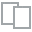
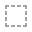
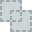
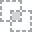
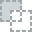
...
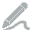
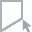
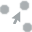
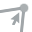
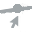

In [102]:
create_report(data, title='Iris Dataset')

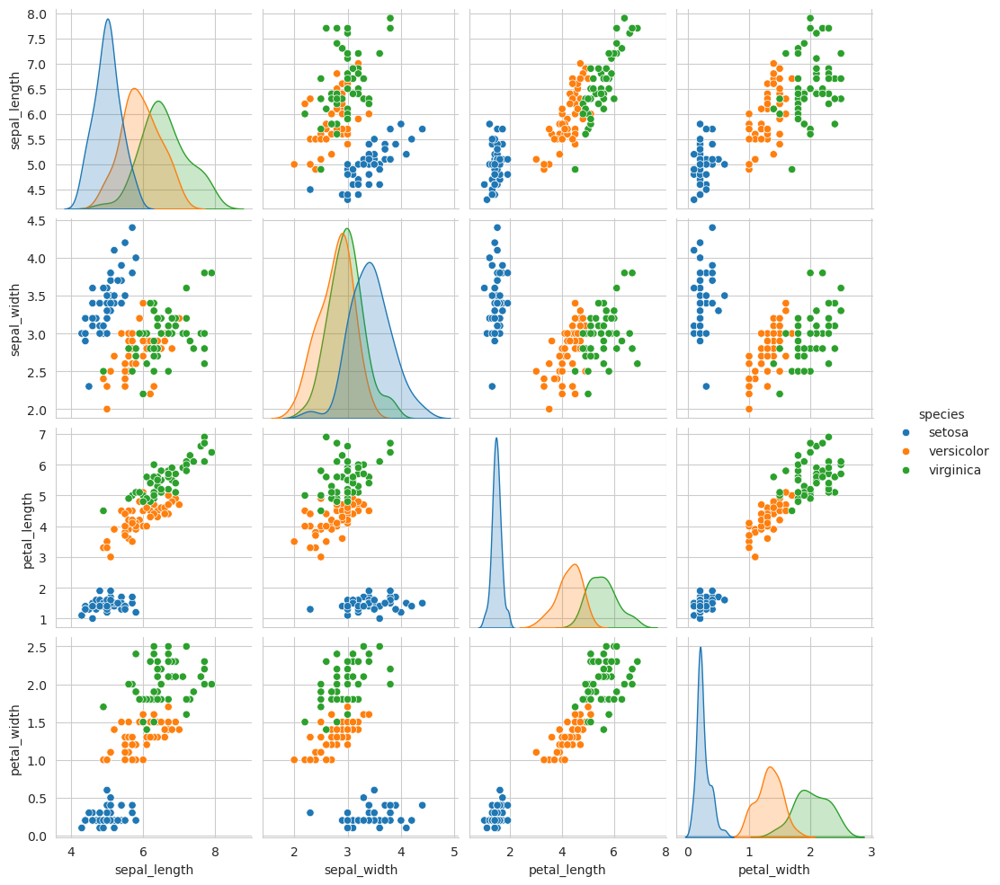

In [103]:
sns.pairplot(data, hue='species')

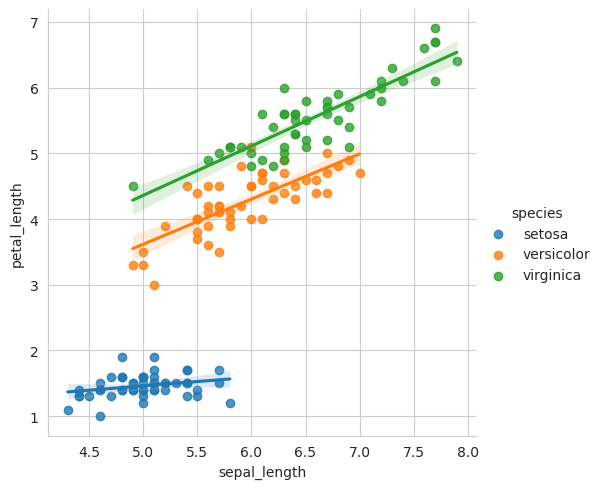

In [105]:
sns.lmplot(data, x='sepal_length', y='petal_length', hue='species')

It may be useful to consider additional features, such as the area of the petals and sepals, and their elongation:

In [106]:
data.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width',
       'species'],
      dtype='object')

In [112]:
def new_iris_features(dataset):
    """
    Computes the area and elongation of each part of the irist flower in the iris dataset.
    """

    for part in ['sepal', 'petal']:
        dataset[part+'_area'] = dataset[part+'_length']*dataset[part+'_width'] # compute area
        dataset[part+'_elongation'] = dataset[part+'_length']/dataset[part+'_width'] # compute elongation

    return

In [115]:
# applying the function 
new_iris_features(data)

In [116]:
data.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species',
       'sepal_area', 'sepal_elongation', 'petal_area', 'petal_elongation'],
      dtype='object')

  0%|                                                                                                         …

/home/mbuenabad/anaconda3/lib/python3.11/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
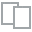
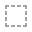
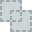
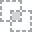
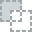
...
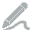
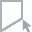
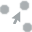
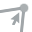
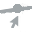

In [117]:
create_report(data)

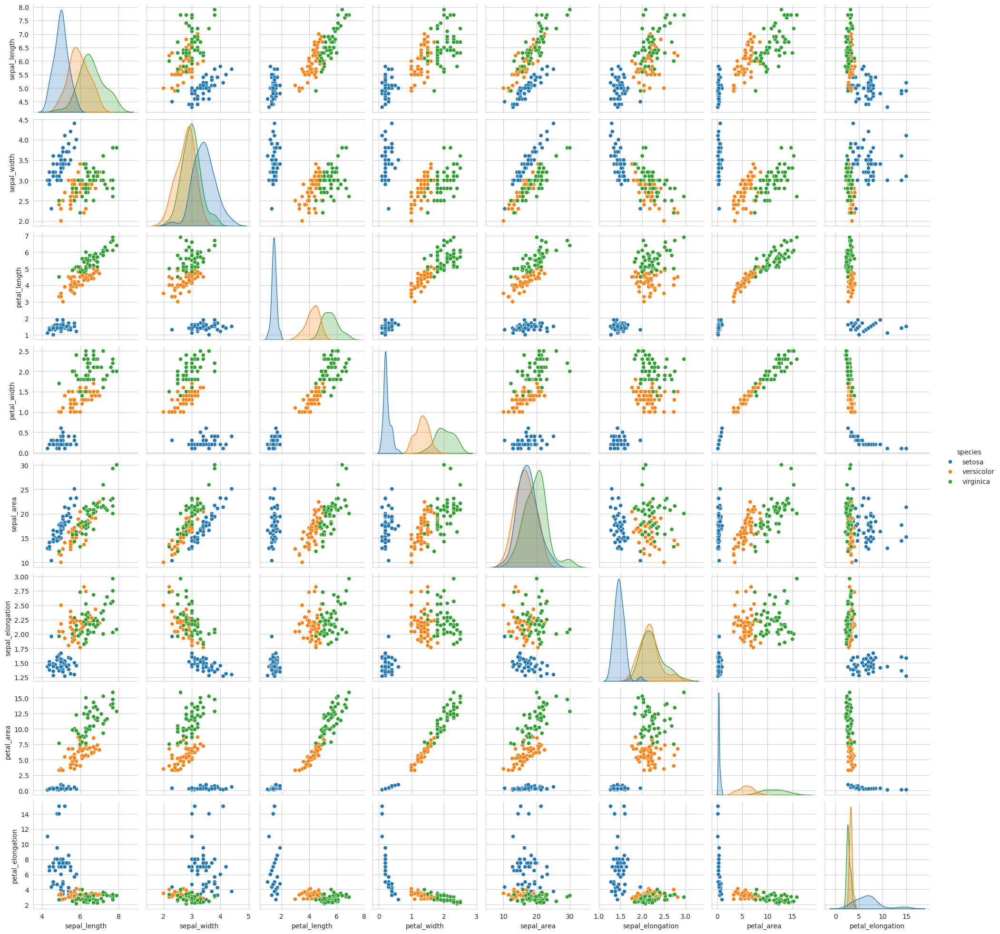

In [119]:
sns.pairplot(data, hue='species')

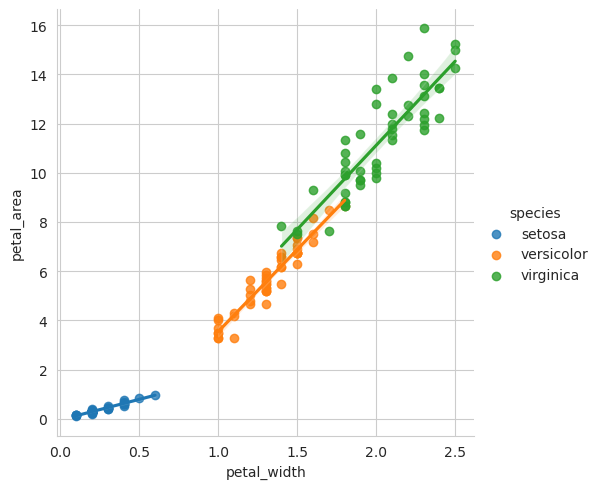

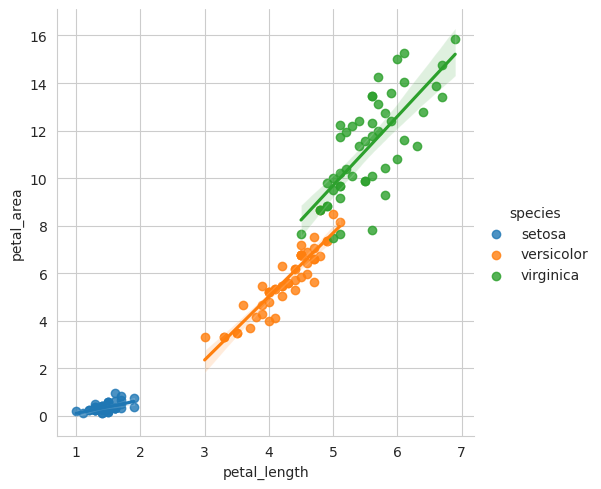

In [120]:
sns.lmplot(data, x='petal_width', y='petal_area', hue='species')
sns.lmplot(data, x='petal_length', y='petal_area', hue='species')

## Model Pipeline

In [269]:
from sklearn.pipeline import Pipeline

from sklearn.preprocessing import LabelEncoder

from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

**TODO:**
1. Finish standard validation models
2. Check Permutation importance, shap, partial dependence
3. Do Cross-validation, with pipelines (including new feature, and hyperparameters)
4. Check permutation importance in pipeline case as well

### Using standard validation

#### Splitting Data

In [127]:
# features vs. target
X = data.select_dtypes(exclude=['object']) # features
y = data['species'] # target

In [196]:
classes = np.unique(y)
print("sorted out species/classes:", classes)

sorted out species/classes: ['setosa' 'versicolor' 'virginica']


In [152]:
# training vs. validation
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=0)

In [281]:
print("X_train.head():\n"+"."*20+"\n", X_train.head())
print("-"*50)
print("y_train.head():\n"+"."*20+"\n", y_train.head())
print("-"*50)
print("y_train.value_counts():\n"+"."*20+"\n", y_train.value_counts())

X_train.head():
....................
      sepal_length  sepal_width  petal_length  petal_width  sepal_area  \
137           6.4          3.1           5.5          1.8       19.84   
84            5.4          3.0           4.5          1.5       16.20   
27            5.2          3.5           1.5          0.2       18.20   
127           6.1          3.0           4.9          1.8       18.30   
132           6.4          2.8           5.6          2.2       17.92   

     sepal_elongation  petal_area  petal_elongation  
137          2.064516        9.90          3.055556  
84           1.800000        6.75          3.000000  
27           1.485714        0.30          7.500000  
127          2.033333        8.82          2.722222  
132          2.285714       12.32          2.545455  
--------------------------------------------------
y_train.head():
....................
 137     virginica
84     versicolor
27         setosa
127     virginica
132     virginica
Name: species, dtype

#### Model 1: `DecisionTreeClassifier`

In [161]:
# ?DecisionTreeClassifier

Init signature:
DecisionTreeClassifier(
    *,
    criterion='gini',
    splitter='best',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    class_weight=None,
    ccp_alpha=0.0,
)
Docstring:     
A decision tree classifier.

Read more in the :ref:`User Guide <tree>`.

Parameters
----------
criterion : {"gini", "entropy", "log_loss"}, default="gini"
    The function to measure the quality of a split. Supported criteria are
    "gini" for the Gini impurity and "log_loss" and "entropy" both for the
    Shannon information gain, see :ref:`tree_mathematical_formulation`.

splitter : {"best", "random"}, default="best"
    The strategy used to choose the split at each node. Supported
    strategies are "best" to choose the best split and "random" to choose
    the best random split.

max_depth : int, default=None
    The maximum depth o

In [239]:
def model_dtc(max_leaf_nodes):
    return DecisionTreeClassifier(random_state=0, max_leaf_nodes=max_leaf_nodes)

def get_f1score(max_leaf_nodes, Xydata, avg='macro'):

    X_train, X_val, y_train, y_val = Xydata

    model = model_dtc(max_leaf_nodes)
    
    model.fit(X_train, y_train)
    y_preds = model.predict(X_val)

    return f1_score(y_val, y_preds, average=avg)

In [249]:
avg = 'macro'

mln_list = range(2, 21)
f1s_list = [get_f1score(mln, (X_train, X_val, y_train, y_val), avg=avg) for mln in mln_list]

In [260]:
?print

Signature: print(*args, sep=' ', end='\n', file=None, flush=False)
Docstring:
Prints the values to a stream, or to sys.stdout by default.

sep
  string inserted between values, default a space.
end
  string appended after the last value, default a newline.
file
  a file-like object (stream); defaults to the current sys.stdout.
flush
  whether to forcibly flush the stream.
Type:      builtin_function_or_method

In [266]:
mln_f1s = dict(zip(mln_list, f1s_list))

for key, val in mln_f1s.items():
    print('max_leaf_nodes =', str(key)+', \t f1 =', val)

max_leaf_nodes = 2, 	 f1 = 0.49333333333333335
max_leaf_nodes = 3, 	 f1 = 0.9095238095238095
max_leaf_nodes = 4, 	 f1 = 0.9095238095238095
max_leaf_nodes = 5, 	 f1 = 1.0
max_leaf_nodes = 6, 	 f1 = 0.957351290684624
max_leaf_nodes = 7, 	 f1 = 0.957351290684624
max_leaf_nodes = 8, 	 f1 = 0.957351290684624
max_leaf_nodes = 9, 	 f1 = 0.957351290684624
max_leaf_nodes = 10, 	 f1 = 0.957351290684624
max_leaf_nodes = 11, 	 f1 = 0.957351290684624
max_leaf_nodes = 12, 	 f1 = 0.957351290684624
max_leaf_nodes = 13, 	 f1 = 0.957351290684624
max_leaf_nodes = 14, 	 f1 = 0.957351290684624
max_leaf_nodes = 15, 	 f1 = 0.957351290684624
max_leaf_nodes = 16, 	 f1 = 0.957351290684624
max_leaf_nodes = 17, 	 f1 = 0.957351290684624
max_leaf_nodes = 18, 	 f1 = 0.957351290684624
max_leaf_nodes = 19, 	 f1 = 0.957351290684624
max_leaf_nodes = 20, 	 f1 = 0.957351290684624


In [258]:
best_max_leaf_nodes = max(mln_f1s, key=mln_f1s.get)
best_model = model_dtc(best_max_leaf_nodes)

print("best max_leaf_nodes =", best_max_leaf_nodes)

best max_leaf_nodes = 5


In [267]:
best_model.fit(X_train, y_train)
y_preds = best_model.predict(X_val)

for species, f1 in zip(classes, f1_score(y_val, y_preds, average=None)):
    print(species+" f1 score:\t", f1)

print("*"*50)

for avg in ['micro', 'macro', 'weighted']:
    print(avg+":", f1_score(y_val, y_preds, average=avg))

setosa f1 score:	 1.0
versicolor f1 score:	 1.0
virginica f1 score:	 1.0
**************************************************
micro: 1.0
macro: 1.0
weighted: 1.0


#### Model 2: `RandomForestClassifier`

In [ ]:
?RandomForestClassifier

In [173]:
model_rfc = RandomForestClassifier(random_state=0)
pipe_rfc = Pipeline(steps=[('model', model_rfc)])

In [174]:
pipe_rfc.fit(X_train, y_train)

Pipeline(steps=[('model', RandomForestClassifier(random_state=0))])

#### Model 3: `XGBClassifier`

In [ ]:
?XGBClassifier

In [175]:
model_xgbc = XGBClassifier(random_state=0)
pipe_xgbc = Pipeline(steps=[('model', model_xgbc)])

In [176]:
pipe_xgbc.fit(X_train, y_train)

ValueError: Invalid classes inferred from unique values of `y`.  Expected: [0 1 2], got ['setosa' 'versicolor' 'virginica']

#### Model 4: `LogisticRegression`